<a href="https://colab.research.google.com/github/YusrilHasanuddin/BATIK-WGAN-WGAN-GP/blob/main/WGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/YusrilHasanuddin/BatikGAN.git

Cloning into 'BatikGAN'...
remote: Enumerating objects: 517, done.
remote: Counting objects: 100% (517/517), done.
remote: Compressing objects: 100% (505/505), done.
remote: Total 517 (delta 15), reused 505 (delta 8), pack-reused 0
Receiving objects: 100% (517/517), 45.12 MiB | 13.78 MiB/s, done.
Resolving deltas: 100% (15/15), done.


In [2]:
!mkdir data
!mv BatikGAN/dataset_batik/Patch/* data
!ls data

 0051-cl_A.jpg
 0051-cl_B.jpg
 0167-sample-solo-jateng-btk-s76-L410b_A.jpg
 0167-sample-solo-jateng-btk-s76-L410b_B.jpg
 0175-cl_A.jpg
 0175-cl_B.jpg
 0179-cl_A.jpg
 0179-cl_B.jpg
 06-nitik-randu-seling_A.jpg
 06-nitik-randu-seling_B.jpg
'10agt 147_A.jpg'
'10agt 147_B.jpg'
 bar-101-batik-yogya-tulis-rakitan-kawung-benggol-ceplok-nogo_A.jpg
 bar-101-batik-yogya-tulis-rakitan-kawung-benggol-ceplok-nogo_B.jpg
 batik-cap-motif-nitik_A.jpg
 batik-cap-motif-nitik_B.jpg
 batik_Grompol_motif_w_A.jpg
 batik_Grompol_motif_w_B.jpg
 Batik-Nitik-Brendi_A.jpg
 Batik-Nitik-Brendi_B.jpg
 batik-tulis-nitik-3_A.jpg
 batik-tulis-nitik-3_B.jpg
 bbr-004-batik-yogya-kombinasi-rakitan-putri-solo_A.jpg
 bbr-004-batik-yogya-kombinasi-rakitan-putri-solo_B.jpg
 ceplok-bintang_A.jpg
 ceplok-bintang_B.jpg
 ceplok-bligon1_A.jpg
 ceplok-bligon1_B.jpg
 ceplok-ganggong_A.jpg
 ceplok-ganggong_B.jpg
 Kawung-Putih-coklat1_A.jpg
 Kawung-Putih-coklat1_B.jpg
'[K]CeplokNitik-S[T]_A.jpg'
'[K]CeplokNitik-S[T]_B.jpg'
 kotak-kaw

In [3]:
path = "data/"


import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(64, 64), batch_size=256 # update from 32
)

Found 326 files belonging to 1 classes.


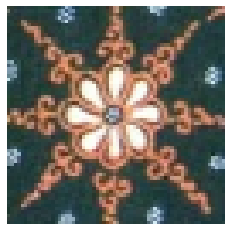

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

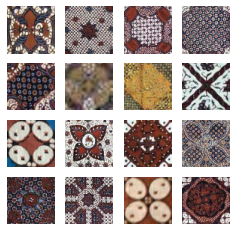

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 64 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))
    

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator() 

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32768)             2129920   
                                                                 
 re_lu_13 (ReLU)             (None, 32768)             0         
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 16, 16, 256)      2097152   
 Transpose)                                                      
                                                                 
 batch_normalization_10 (Bat  (None, 16, 16, 256)      1024      
 chNormalization)                                                
                                                                 
 re_lu_14 (ReLU)             (None, 16, 16, 256)       0 

In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
class WeightClipping(tf.keras.constraints.Constraint):
    def __init__(self, clip_value):
        self.clip_value = clip_value
    
    def __call__(self, weights):
        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
    
    def get_config(self):
        return {'clip_value': self.clip_value}

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    #UPDATE for WGAN: enfoce 1-Lipschitz constraint with weight clippping to [-1, 1] 
    constraint = WeightClipping(0.01)

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint, # UPDATE for WGAN
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2), 
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # UPDATE for WGAN: linear activation in the last layer. 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0    

In [ ]:
class WGAN(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps): # UPDATE
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN: remove the code of real / fake labels
    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # UPDATE for WGAN: we train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images 
            with tf.GradientTape() as tape:
                # Get the critic' predictions on the real images
                pred_real = self.critic(real_images, training=True)
                # Generate fake images from the latent noise
                fake_images = self.generator(noise, training=True) 
                # Get the critic' predictions on the fake images
                pred_fake = self.critic(fake_images, training=True)
                # Calculate the critic loss with wassertein loss function
                d_loss = self.d_loss_fn(pred_real, pred_fake)
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake) 
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator weights
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan = WGAN(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) # UPDATE for WGAN

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.00005 # UPDATE for WGAN: learning rate per WGAN paper

In [ ]:
wgan.compile(
    d_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    g_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/100
2/2 [==============================] - ETA: 0s - d_loss: -0.0071 - g_loss: 0.0018

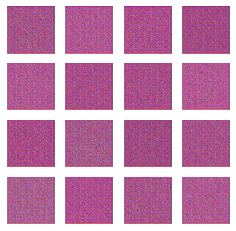

2/2 [==============================] - 8s 2s/step - d_loss: -0.0071 - g_loss: 0.0018
Epoch 2/100
2/2 [==============================] - ETA: 0s - d_loss: -0.0151 - g_loss: 6.6281e-04

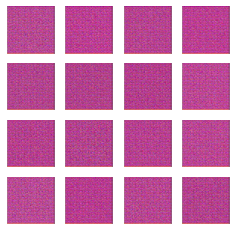

2/2 [==============================] - 2s 631ms/step - d_loss: -0.0151 - g_loss: 6.6281e-04
Epoch 3/100
2/2 [==============================] - ETA: 0s - d_loss: -0.0448 - g_loss: 0.0097

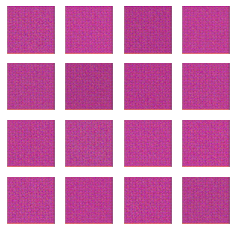

2/2 [==============================] - 2s 628ms/step - d_loss: -0.0448 - g_loss: 0.0097
Epoch 4/100
2/2 [==============================] - ETA: 0s - d_loss: -0.1026 - g_loss: 0.0167

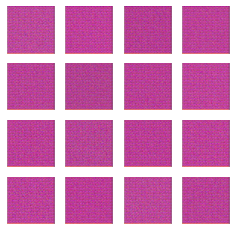

2/2 [==============================] - 2s 645ms/step - d_loss: -0.1026 - g_loss: 0.0167
Epoch 5/100
2/2 [==============================] - ETA: 0s - d_loss: -0.2111 - g_loss: 0.0707

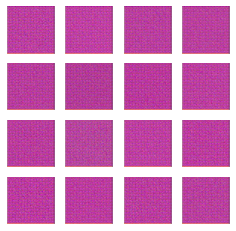

2/2 [==============================] - 2s 663ms/step - d_loss: -0.2111 - g_loss: 0.0707
Epoch 6/100
2/2 [==============================] - ETA: 0s - d_loss: -0.3510 - g_loss: 0.1109

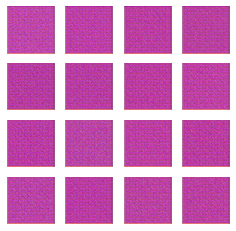

2/2 [==============================] - 2s 878ms/step - d_loss: -0.3510 - g_loss: 0.1109
Epoch 7/100
2/2 [==============================] - ETA: 0s - d_loss: -0.5699 - g_loss: 0.1969

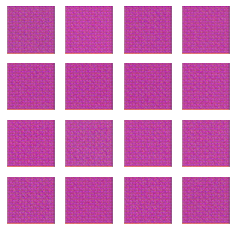

2/2 [==============================] - 2s 635ms/step - d_loss: -0.5699 - g_loss: 0.1969
Epoch 8/100
2/2 [==============================] - ETA: 0s - d_loss: -0.9876 - g_loss: 0.3478

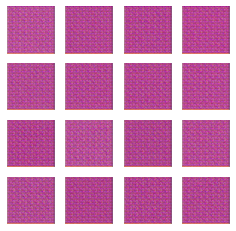

2/2 [==============================] - 2s 666ms/step - d_loss: -0.9876 - g_loss: 0.3478
Epoch 9/100
2/2 [==============================] - ETA: 0s - d_loss: -1.5485 - g_loss: 0.6167

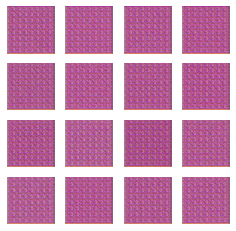

2/2 [==============================] - 2s 636ms/step - d_loss: -1.5485 - g_loss: 0.6167
Epoch 10/100
2/2 [==============================] - ETA: 0s - d_loss: -2.0299 - g_loss: 0.9317

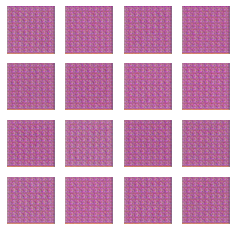

2/2 [==============================] - 2s 628ms/step - d_loss: -2.0299 - g_loss: 0.9317
Epoch 11/100
2/2 [==============================] - ETA: 0s - d_loss: -2.9953 - g_loss: 1.1745

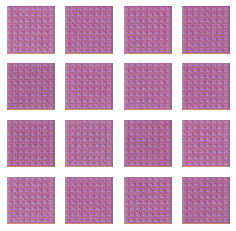

2/2 [==============================] - 2s 656ms/step - d_loss: -2.9953 - g_loss: 1.1745
Epoch 12/100
2/2 [==============================] - ETA: 0s - d_loss: -3.9249 - g_loss: 1.3044

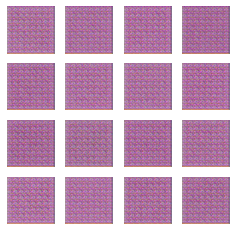

2/2 [==============================] - 2s 632ms/step - d_loss: -3.9249 - g_loss: 1.3044
Epoch 13/100
2/2 [==============================] - ETA: 0s - d_loss: -3.6348 - g_loss: 0.6248

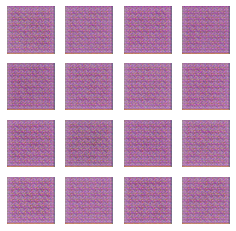

2/2 [==============================] - 2s 948ms/step - d_loss: -3.6348 - g_loss: 0.6248
Epoch 14/100
2/2 [==============================] - ETA: 0s - d_loss: -3.0883 - g_loss: -0.1263

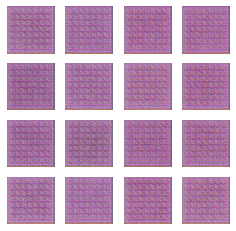

2/2 [==============================] - 2s 637ms/step - d_loss: -3.0883 - g_loss: -0.1263
Epoch 15/100
2/2 [==============================] - ETA: 0s - d_loss: -2.5365 - g_loss: -0.5909

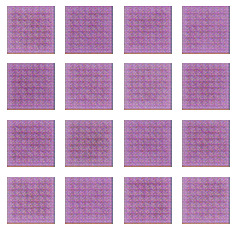

2/2 [==============================] - 2s 653ms/step - d_loss: -2.5365 - g_loss: -0.5909
Epoch 16/100
2/2 [==============================] - ETA: 0s - d_loss: -1.5285 - g_loss: -0.8768

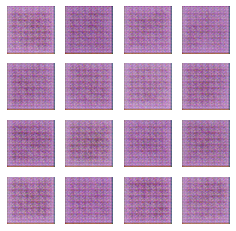

2/2 [==============================] - 2s 644ms/step - d_loss: -1.5285 - g_loss: -0.8768
Epoch 17/100
2/2 [==============================] - ETA: 0s - d_loss: -1.2964 - g_loss: 0.3095 

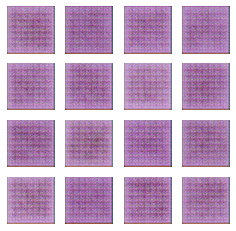

2/2 [==============================] - 2s 633ms/step - d_loss: -1.2964 - g_loss: 0.3095
Epoch 18/100
2/2 [==============================] - ETA: 0s - d_loss: -1.4563 - g_loss: 2.5433

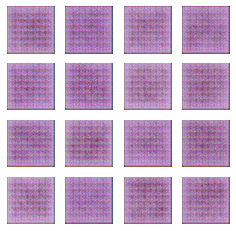

2/2 [==============================] - 2s 632ms/step - d_loss: -1.4563 - g_loss: 2.5433
Epoch 19/100
2/2 [==============================] - ETA: 0s - d_loss: -2.3055 - g_loss: 4.3972

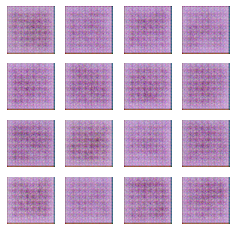

2/2 [==============================] - 2s 631ms/step - d_loss: -2.3055 - g_loss: 4.3972
Epoch 20/100
2/2 [==============================] - ETA: 0s - d_loss: -3.5786 - g_loss: 5.8258

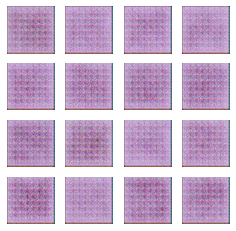

2/2 [==============================] - 2s 895ms/step - d_loss: -3.5786 - g_loss: 5.8258
Epoch 21/100
2/2 [==============================] - ETA: 0s - d_loss: -4.5398 - g_loss: 6.8875

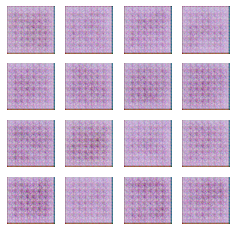

2/2 [==============================] - 2s 630ms/step - d_loss: -4.5398 - g_loss: 6.8875
Epoch 22/100
2/2 [==============================] - ETA: 0s - d_loss: -5.1346 - g_loss: 6.7400

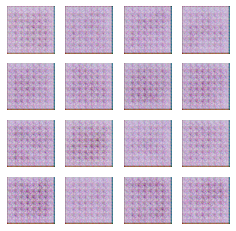

2/2 [==============================] - 2s 658ms/step - d_loss: -5.1346 - g_loss: 6.7400
Epoch 23/100
2/2 [==============================] - ETA: 0s - d_loss: -6.2444 - g_loss: 5.6666

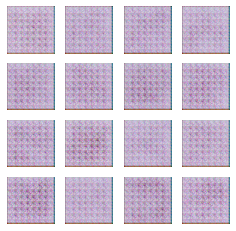

2/2 [==============================] - 2s 639ms/step - d_loss: -6.2444 - g_loss: 5.6666
Epoch 24/100
2/2 [==============================] - ETA: 0s - d_loss: -7.6557 - g_loss: 4.9360

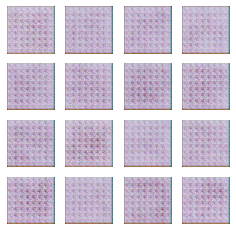

2/2 [==============================] - 2s 628ms/step - d_loss: -7.6557 - g_loss: 4.9360
Epoch 25/100
2/2 [==============================] - ETA: 0s - d_loss: -7.3161 - g_loss: 2.7424

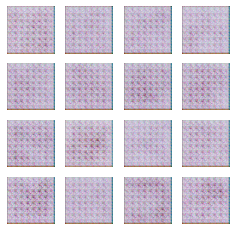

2/2 [==============================] - 2s 636ms/step - d_loss: -7.3161 - g_loss: 2.7424
Epoch 26/100
2/2 [==============================] - ETA: 0s - d_loss: -7.8305 - g_loss: 3.0592

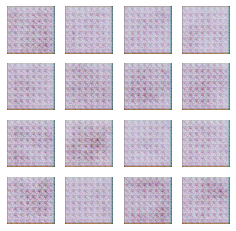

2/2 [==============================] - 2s 640ms/step - d_loss: -7.8305 - g_loss: 3.0592
Epoch 27/100
2/2 [==============================] - ETA: 0s - d_loss: -6.6229 - g_loss: 1.0145

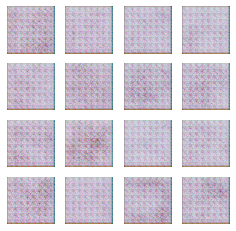

2/2 [==============================] - 2s 896ms/step - d_loss: -6.6229 - g_loss: 1.0145
Epoch 28/100
2/2 [==============================] - ETA: 0s - d_loss: -5.5418 - g_loss: -0.7328

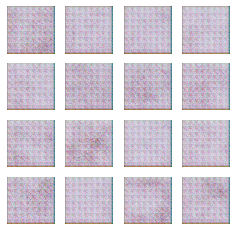

2/2 [==============================] - 2s 623ms/step - d_loss: -5.5418 - g_loss: -0.7328
Epoch 29/100
2/2 [==============================] - ETA: 0s - d_loss: -3.9787 - g_loss: -1.9327

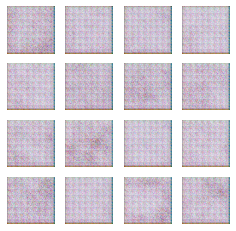

2/2 [==============================] - 2s 626ms/step - d_loss: -3.9787 - g_loss: -1.9327
Epoch 30/100
2/2 [==============================] - ETA: 0s - d_loss: -2.6136 - g_loss: -4.2838

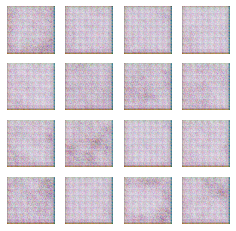

2/2 [==============================] - 2s 630ms/step - d_loss: -2.6136 - g_loss: -4.2838
Epoch 31/100
2/2 [==============================] - ETA: 0s - d_loss: -1.8346 - g_loss: -2.5426

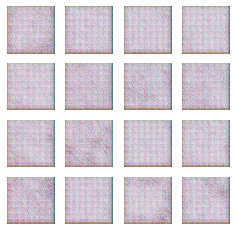

2/2 [==============================] - 2s 636ms/step - d_loss: -1.8346 - g_loss: -2.5426
Epoch 32/100
2/2 [==============================] - ETA: 0s - d_loss: -1.4994 - g_loss: -0.9871

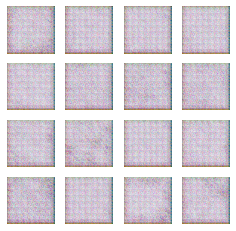

2/2 [==============================] - 2s 657ms/step - d_loss: -1.4994 - g_loss: -0.9871
Epoch 33/100
2/2 [==============================] - ETA: 0s - d_loss: -1.8102 - g_loss: -1.1822

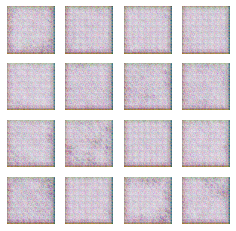

2/2 [==============================] - 2s 636ms/step - d_loss: -1.8102 - g_loss: -1.1822
Epoch 34/100
2/2 [==============================] - ETA: 0s - d_loss: -2.0593 - g_loss: 0.3266

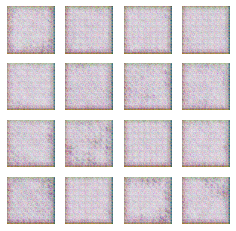

2/2 [==============================] - 2s 632ms/step - d_loss: -2.0593 - g_loss: 0.3266
Epoch 35/100
2/2 [==============================] - ETA: 0s - d_loss: -2.8041 - g_loss: 2.7595

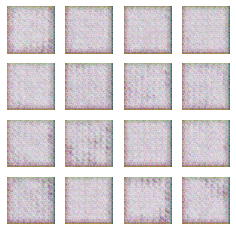

2/2 [==============================] - 2s 954ms/step - d_loss: -2.8041 - g_loss: 2.7595
Epoch 36/100
2/2 [==============================] - ETA: 0s - d_loss: -3.9490 - g_loss: 4.2526

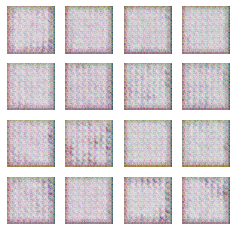

2/2 [==============================] - 2s 637ms/step - d_loss: -3.9490 - g_loss: 4.2526
Epoch 37/100
2/2 [==============================] - ETA: 0s - d_loss: -4.7701 - g_loss: 6.5709

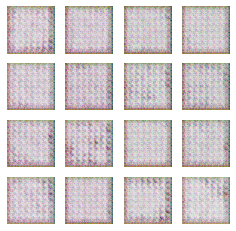

2/2 [==============================] - 2s 632ms/step - d_loss: -4.7701 - g_loss: 6.5709
Epoch 38/100
2/2 [==============================] - ETA: 0s - d_loss: -6.4615 - g_loss: 6.0933

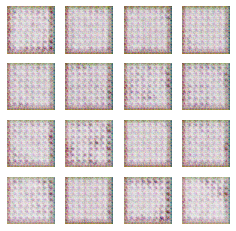

2/2 [==============================] - 2s 629ms/step - d_loss: -6.4615 - g_loss: 6.0933
Epoch 39/100
2/2 [==============================] - ETA: 0s - d_loss: -7.5004 - g_loss: 5.9473

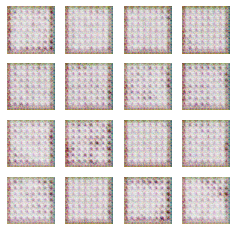

2/2 [==============================] - 2s 660ms/step - d_loss: -7.5004 - g_loss: 5.9473
Epoch 40/100
2/2 [==============================] - ETA: 0s - d_loss: -8.4742 - g_loss: 6.8502

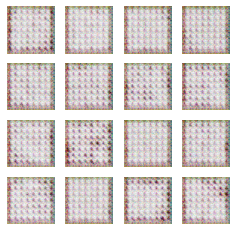

2/2 [==============================] - 2s 624ms/step - d_loss: -8.4742 - g_loss: 6.8502
Epoch 41/100
2/2 [==============================] - ETA: 0s - d_loss: -8.5539 - g_loss: 6.2827

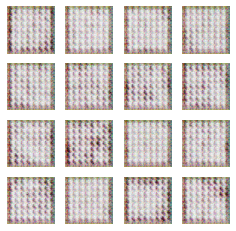

2/2 [==============================] - 2s 636ms/step - d_loss: -8.5539 - g_loss: 6.2827
Epoch 42/100
2/2 [==============================] - ETA: 0s - d_loss: -7.7195 - g_loss: 5.4043

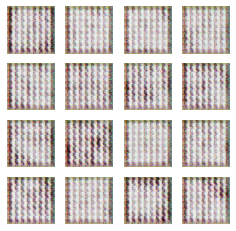

2/2 [==============================] - 2s 956ms/step - d_loss: -7.7195 - g_loss: 5.4043
Epoch 43/100
2/2 [==============================] - ETA: 0s - d_loss: -8.1836 - g_loss: 6.7774

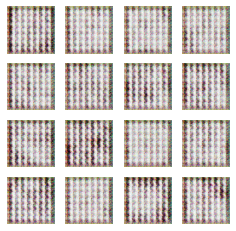

2/2 [==============================] - 2s 626ms/step - d_loss: -8.1836 - g_loss: 6.7774
Epoch 44/100
2/2 [==============================] - ETA: 0s - d_loss: -12.7078 - g_loss: 10.5849

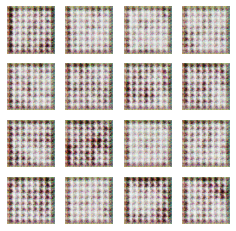

2/2 [==============================] - 2s 630ms/step - d_loss: -12.7078 - g_loss: 10.5849
Epoch 45/100
2/2 [==============================] - ETA: 0s - d_loss: -12.3732 - g_loss: 9.1385

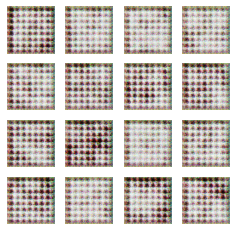

2/2 [==============================] - 2s 634ms/step - d_loss: -12.3732 - g_loss: 9.1385
Epoch 46/100
2/2 [==============================] - ETA: 0s - d_loss: -8.4494 - g_loss: 5.2209

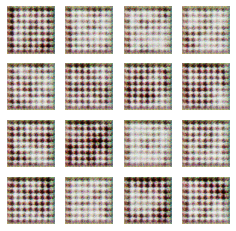

2/2 [==============================] - 2s 635ms/step - d_loss: -8.4494 - g_loss: 5.2209
Epoch 47/100
2/2 [==============================] - ETA: 0s - d_loss: -6.7612 - g_loss: 4.6538

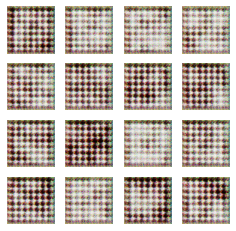

2/2 [==============================] - 2s 627ms/step - d_loss: -6.7612 - g_loss: 4.6538
Epoch 48/100
2/2 [==============================] - ETA: 0s - d_loss: -7.1230 - g_loss: 5.9118

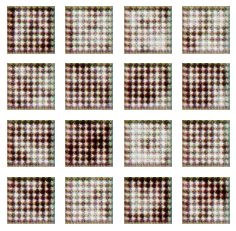

2/2 [==============================] - 2s 645ms/step - d_loss: -7.1230 - g_loss: 5.9118
Epoch 49/100
2/2 [==============================] - ETA: 0s - d_loss: -8.3766 - g_loss: 8.6955

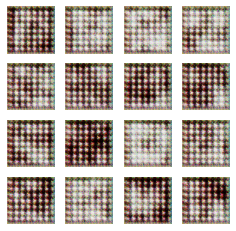

2/2 [==============================] - 2s 875ms/step - d_loss: -8.3766 - g_loss: 8.6955
Epoch 50/100
2/2 [==============================] - ETA: 0s - d_loss: -10.1053 - g_loss: 10.2251

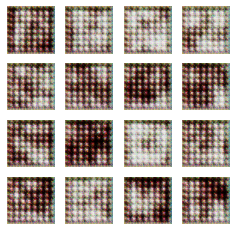

2/2 [==============================] - 2s 628ms/step - d_loss: -10.1053 - g_loss: 10.2251
Epoch 51/100
2/2 [==============================] - ETA: 0s - d_loss: -9.4805 - g_loss: 9.6338 

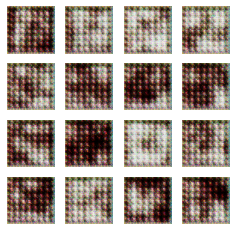

2/2 [==============================] - 2s 632ms/step - d_loss: -9.4805 - g_loss: 9.6338
Epoch 52/100
2/2 [==============================] - ETA: 0s - d_loss: -7.7736 - g_loss: 11.9982

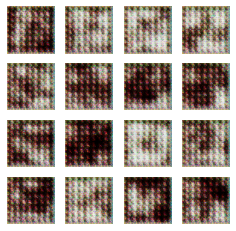

2/2 [==============================] - 2s 636ms/step - d_loss: -7.7736 - g_loss: 11.9982
Epoch 53/100
2/2 [==============================] - ETA: 0s - d_loss: -7.8287 - g_loss: 13.1916

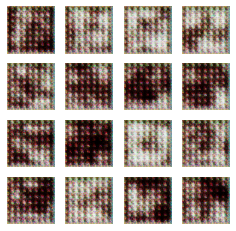

2/2 [==============================] - 2s 630ms/step - d_loss: -7.8287 - g_loss: 13.1916
Epoch 54/100
2/2 [==============================] - ETA: 0s - d_loss: -7.9896 - g_loss: 13.9492

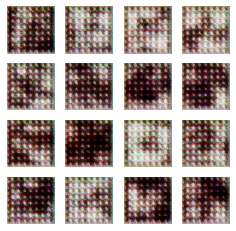

2/2 [==============================] - 2s 636ms/step - d_loss: -7.9896 - g_loss: 13.9492
Epoch 55/100
2/2 [==============================] - ETA: 0s - d_loss: -9.4362 - g_loss: 16.6961

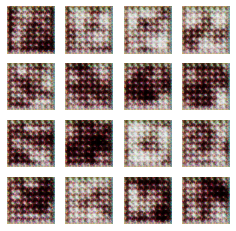

2/2 [==============================] - 2s 626ms/step - d_loss: -9.4362 - g_loss: 16.6961
Epoch 56/100
2/2 [==============================] - ETA: 0s - d_loss: -10.1641 - g_loss: 17.0123

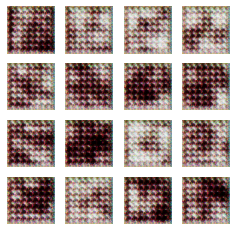

2/2 [==============================] - 2s 941ms/step - d_loss: -10.1641 - g_loss: 17.0123
Epoch 57/100
2/2 [==============================] - ETA: 0s - d_loss: -10.2722 - g_loss: 14.1195

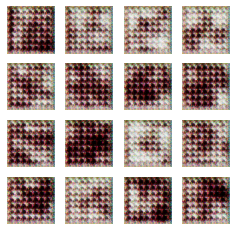

2/2 [==============================] - 2s 653ms/step - d_loss: -10.2722 - g_loss: 14.1195
Epoch 58/100
2/2 [==============================] - ETA: 0s - d_loss: -11.3291 - g_loss: 12.4053

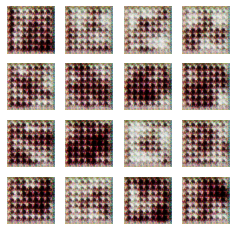

2/2 [==============================] - 2s 645ms/step - d_loss: -11.3291 - g_loss: 12.4053
Epoch 59/100
2/2 [==============================] - ETA: 0s - d_loss: -13.6478 - g_loss: 12.9740

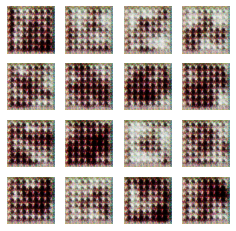

2/2 [==============================] - 2s 643ms/step - d_loss: -13.6478 - g_loss: 12.9740
Epoch 60/100
2/2 [==============================] - ETA: 0s - d_loss: -17.7194 - g_loss: 13.8923

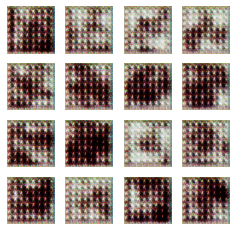

2/2 [==============================] - 2s 629ms/step - d_loss: -17.7194 - g_loss: 13.8923
Epoch 61/100
2/2 [==============================] - ETA: 0s - d_loss: -19.0502 - g_loss: 14.5383

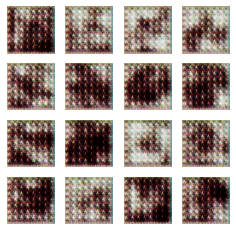

2/2 [==============================] - 2s 649ms/step - d_loss: -19.0502 - g_loss: 14.5383
Epoch 62/100
2/2 [==============================] - ETA: 0s - d_loss: -17.2784 - g_loss: 15.0990

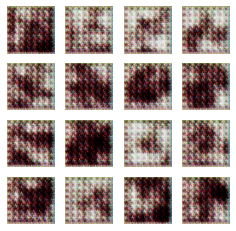

2/2 [==============================] - 2s 626ms/step - d_loss: -17.2784 - g_loss: 15.0990
Epoch 63/100
2/2 [==============================] - ETA: 0s - d_loss: -13.9228 - g_loss: 12.8055

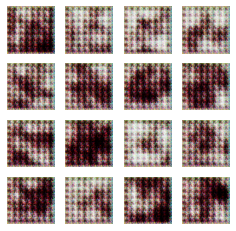

2/2 [==============================] - 2s 698ms/step - d_loss: -13.9228 - g_loss: 12.8055
Epoch 64/100
2/2 [==============================] - ETA: 0s - d_loss: -12.7503 - g_loss: 12.1499

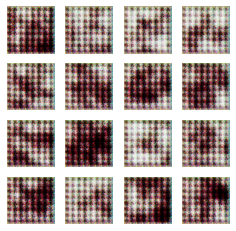

2/2 [==============================] - 2s 909ms/step - d_loss: -12.7503 - g_loss: 12.1499
Epoch 65/100
2/2 [==============================] - ETA: 0s - d_loss: -14.5900 - g_loss: 11.1875

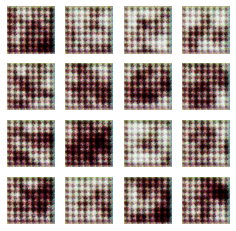

2/2 [==============================] - 2s 629ms/step - d_loss: -14.5900 - g_loss: 11.1875
Epoch 66/100
2/2 [==============================] - ETA: 0s - d_loss: -17.6349 - g_loss: 11.6427

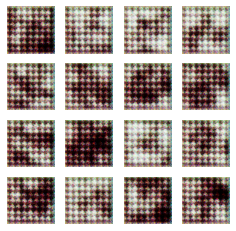

2/2 [==============================] - 2s 623ms/step - d_loss: -17.6349 - g_loss: 11.6427
Epoch 67/100
2/2 [==============================] - ETA: 0s - d_loss: -18.7752 - g_loss: 9.5900 

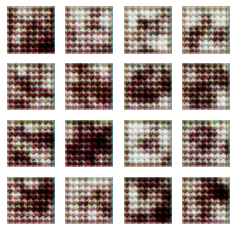

2/2 [==============================] - 2s 638ms/step - d_loss: -18.7752 - g_loss: 9.5900
Epoch 68/100
2/2 [==============================] - ETA: 0s - d_loss: -17.0789 - g_loss: 1.8807

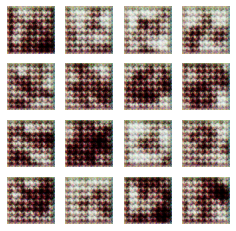

2/2 [==============================] - 2s 636ms/step - d_loss: -17.0789 - g_loss: 1.8807
Epoch 69/100
2/2 [==============================] - ETA: 0s - d_loss: -14.9056 - g_loss: -1.7860

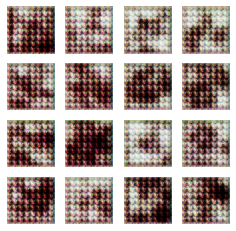

2/2 [==============================] - 2s 640ms/step - d_loss: -14.9056 - g_loss: -1.7860
Epoch 70/100
2/2 [==============================] - ETA: 0s - d_loss: -15.6261 - g_loss: 0.1632 

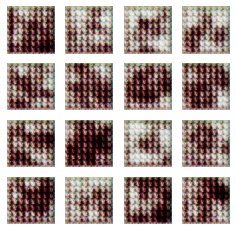

2/2 [==============================] - 2s 633ms/step - d_loss: -15.6261 - g_loss: 0.1632
Epoch 71/100
2/2 [==============================] - ETA: 0s - d_loss: -18.6107 - g_loss: 5.3871

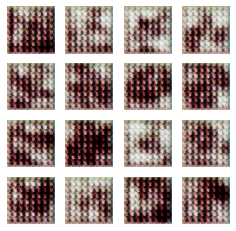

2/2 [==============================] - 2s 892ms/step - d_loss: -18.6107 - g_loss: 5.3871
Epoch 72/100
2/2 [==============================] - ETA: 0s - d_loss: -23.1046 - g_loss: 13.5538

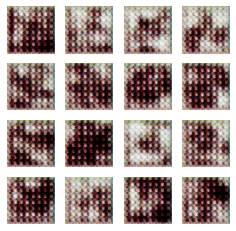

2/2 [==============================] - 2s 633ms/step - d_loss: -23.1046 - g_loss: 13.5538
Epoch 73/100
2/2 [==============================] - ETA: 0s - d_loss: -25.3448 - g_loss: 16.5093

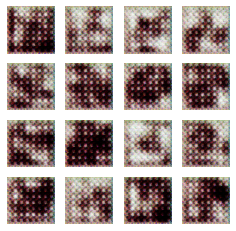

2/2 [==============================] - 2s 637ms/step - d_loss: -25.3448 - g_loss: 16.5093
Epoch 74/100
2/2 [==============================] - ETA: 0s - d_loss: -20.6188 - g_loss: 13.9761

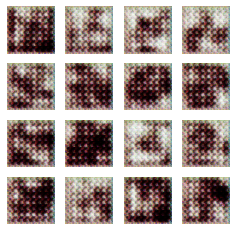

2/2 [==============================] - 2s 630ms/step - d_loss: -20.6188 - g_loss: 13.9761
Epoch 75/100
2/2 [==============================] - ETA: 0s - d_loss: -15.7565 - g_loss: 10.9826

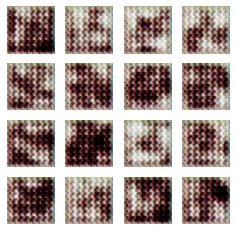

2/2 [==============================] - 2s 631ms/step - d_loss: -15.7565 - g_loss: 10.9826
Epoch 76/100
2/2 [==============================] - ETA: 0s - d_loss: -14.1598 - g_loss: 13.3572

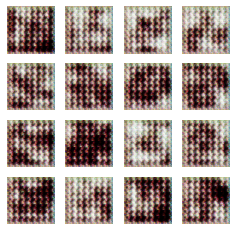

2/2 [==============================] - 2s 641ms/step - d_loss: -14.1598 - g_loss: 13.3572
Epoch 77/100
2/2 [==============================] - ETA: 0s - d_loss: -19.1700 - g_loss: 19.7688

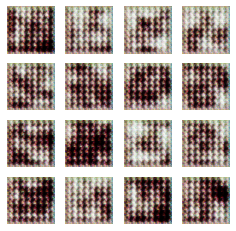

2/2 [==============================] - 2s 636ms/step - d_loss: -19.1700 - g_loss: 19.7688
Epoch 78/100
2/2 [==============================] - ETA: 0s - d_loss: -28.1850 - g_loss: 25.0873

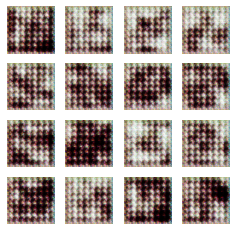

2/2 [==============================] - 2s 895ms/step - d_loss: -28.1850 - g_loss: 25.0873
Epoch 79/100
2/2 [==============================] - ETA: 0s - d_loss: -34.8991 - g_loss: 25.4625

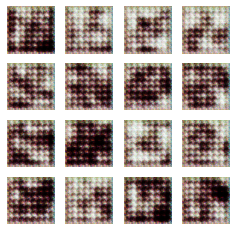

2/2 [==============================] - 2s 624ms/step - d_loss: -34.8991 - g_loss: 25.4625
Epoch 80/100
2/2 [==============================] - ETA: 0s - d_loss: -33.4377 - g_loss: 17.7381

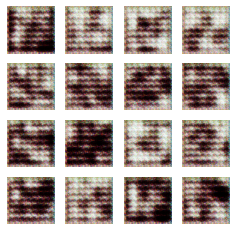

2/2 [==============================] - 2s 647ms/step - d_loss: -33.4377 - g_loss: 17.7381
Epoch 81/100
2/2 [==============================] - ETA: 0s - d_loss: -23.7482 - g_loss: 5.8070

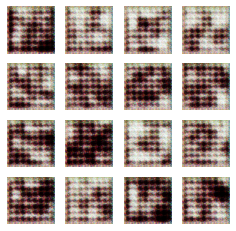

2/2 [==============================] - 2s 626ms/step - d_loss: -23.7482 - g_loss: 5.8070
Epoch 82/100
2/2 [==============================] - ETA: 0s - d_loss: -18.5592 - g_loss: -1.7415

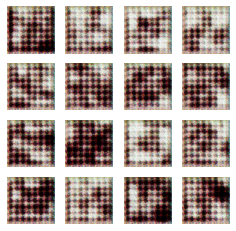

2/2 [==============================] - 2s 629ms/step - d_loss: -18.5592 - g_loss: -1.7415
Epoch 83/100
2/2 [==============================] - ETA: 0s - d_loss: -20.6550 - g_loss: -0.2164

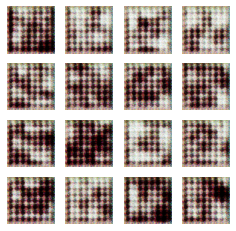

2/2 [==============================] - 2s 644ms/step - d_loss: -20.6550 - g_loss: -0.2164
Epoch 84/100
2/2 [==============================] - ETA: 0s - d_loss: -28.8236 - g_loss: 5.3833

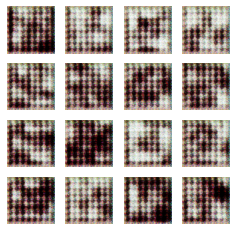

2/2 [==============================] - 2s 629ms/step - d_loss: -28.8236 - g_loss: 5.3833
Epoch 85/100
2/2 [==============================] - ETA: 0s - d_loss: -35.9392 - g_loss: 13.1899

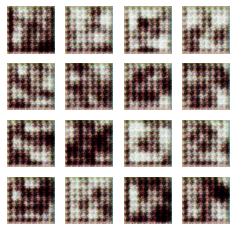

2/2 [==============================] - 2s 914ms/step - d_loss: -35.9392 - g_loss: 13.1899
Epoch 86/100
2/2 [==============================] - ETA: 0s - d_loss: -39.0501 - g_loss: 14.8456

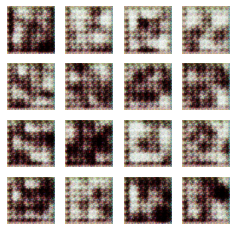

2/2 [==============================] - 2s 671ms/step - d_loss: -39.0501 - g_loss: 14.8456
Epoch 87/100
2/2 [==============================] - ETA: 0s - d_loss: -31.8035 - g_loss: 7.8352

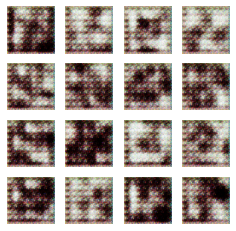

2/2 [==============================] - 2s 635ms/step - d_loss: -31.8035 - g_loss: 7.8352
Epoch 88/100
2/2 [==============================] - ETA: 0s - d_loss: -23.5213 - g_loss: 0.3532 

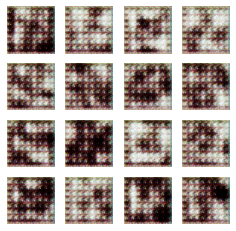

2/2 [==============================] - 2s 636ms/step - d_loss: -23.5213 - g_loss: 0.3532
Epoch 89/100
2/2 [==============================] - ETA: 0s - d_loss: -18.2482 - g_loss: -5.5325

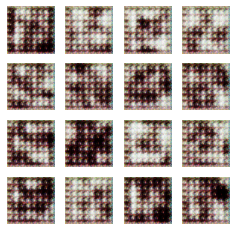

2/2 [==============================] - 2s 638ms/step - d_loss: -18.2482 - g_loss: -5.5325
Epoch 90/100
2/2 [==============================] - ETA: 0s - d_loss: -22.1701 - g_loss: -2.4800

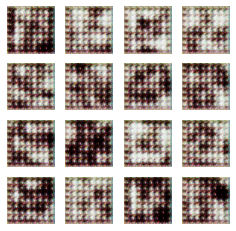

2/2 [==============================] - 2s 702ms/step - d_loss: -22.1701 - g_loss: -2.4800
Epoch 91/100
2/2 [==============================] - ETA: 0s - d_loss: -26.8240 - g_loss: 4.3970

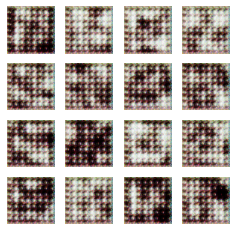

2/2 [==============================] - 2s 634ms/step - d_loss: -26.8240 - g_loss: 4.3970
Epoch 92/100
2/2 [==============================] - ETA: 0s - d_loss: -34.0920 - g_loss: 9.5611

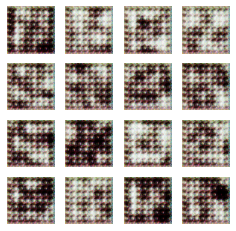

2/2 [==============================] - 2s 634ms/step - d_loss: -34.0920 - g_loss: 9.5611
Epoch 93/100
2/2 [==============================] - ETA: 0s - d_loss: -39.0476 - g_loss: 12.9874

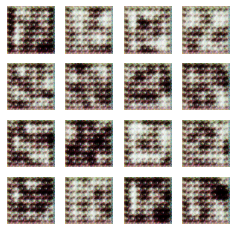

2/2 [==============================] - 2s 906ms/step - d_loss: -39.0476 - g_loss: 12.9874
Epoch 94/100
2/2 [==============================] - ETA: 0s - d_loss: -41.1423 - g_loss: 13.1104

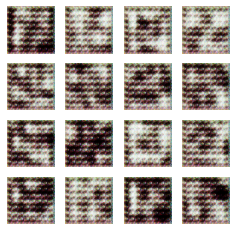

2/2 [==============================] - 2s 627ms/step - d_loss: -41.1423 - g_loss: 13.1104
Epoch 95/100
2/2 [==============================] - ETA: 0s - d_loss: -42.0481 - g_loss: 12.7131

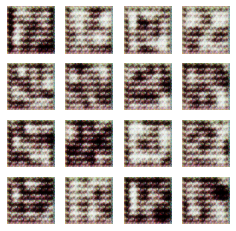

2/2 [==============================] - 2s 632ms/step - d_loss: -42.0481 - g_loss: 12.7131
Epoch 96/100
2/2 [==============================] - ETA: 0s - d_loss: -43.1280 - g_loss: 12.2690

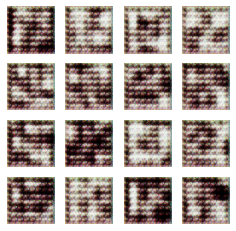

2/2 [==============================] - 2s 628ms/step - d_loss: -43.1280 - g_loss: 12.2690
Epoch 97/100
2/2 [==============================] - ETA: 0s - d_loss: -45.8811 - g_loss: 15.3805

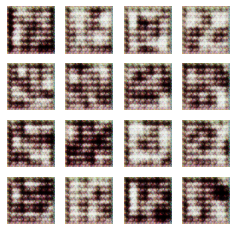

2/2 [==============================] - 2s 638ms/step - d_loss: -45.8811 - g_loss: 15.3805
Epoch 98/100
2/2 [==============================] - ETA: 0s - d_loss: -46.3079 - g_loss: 20.4367

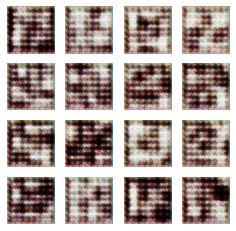

2/2 [==============================] - 2s 627ms/step - d_loss: -46.3079 - g_loss: 20.4367
Epoch 99/100
2/2 [==============================] - ETA: 0s - d_loss: -46.1862 - g_loss: 17.5196

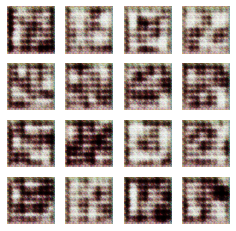

2/2 [==============================] - 2s 633ms/step - d_loss: -46.1862 - g_loss: 17.5196
Epoch 100/100
2/2 [==============================] - ETA: 0s - d_loss: -42.0641 - g_loss: 13.1103

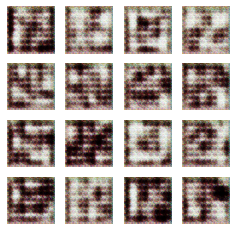

2/2 [==============================] - 2s 890ms/step - d_loss: -42.0641 - g_loss: 13.1103


In [ ]:
NUM_EPOCHS = 100 # number of epochs
wgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])